# Student Habits vs Academic Performance
Authors: 
- Christopher Tangonan
- Edward Torres
- Guillermo Zendejas
- Victoria Ramirez


### Introduction
Students usually have busy lives while enrolled in school. Many of their habits can affect their perfomances in their classes, espeically when taking an exam in any of their classes. In this project, we will look to determine a relationship between a student’s habits and possibly predict their exam score based on those habits. Habits, such as a student's sleep hours, study time, attendance percentage, exercise frequency, and extracurricular participation, will be analzyed. We will be using the “Student Habits vs Academic Performance” dataset from Kaggle. First, we’ll load and clean the data in pandas (check for nulls, basic sanity checks), then explore relationships with matplotlib (histograms, scatterplots, correlation). As we complete additional class modules on data wrangling, kNN, and linear regression, we expect to use additional methods to further analyze our data to predict student performance. We will interpret the results to answer our question about the relationship between the students' habits and their final score performance.

### Dataset 
We will be using the “Student Habits vs Academic Performance” dataset which was obtained from Kaggle. It was downloaded on May 25th at 7:30 pm and the last update was about a month before we downloaded it. The author of the data is Jayantha Nath. It is simulated data with 1000 synthetic student records. There are a total of 1000 rows and 16 columns. Each student is provided with a student ID, age, and gender to identify them in columns 0, 1, and 2. Columns 3 through 14 represent the habits that students can partake in that can affect their exam scores. These habits range from hours studying to the number of hours they spend watching Netflix.  Exam scores are given in the last column.

See below for a quick overview of the dataset. 

In [54]:

# import libraries
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import rcParams
import matplotlib.pyplot as plt
import math

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from scipy.stats import zscore


# allow output to span multiple output lines in the console
pd.set_option('display.max_columns', 500)

# switch to seaborn default stylistic parameters
# see the useful https://seaborn.pydata.org/tutorial/aesthetics.html
sns.set()
sns.set_context('paper') # 'talk' for slightly larger

# change default plot size
rcParams['figure.figsize'] = 9,7

In [55]:
# read database
df = pd.read_csv("./src/student_habits_performance.csv", index_col=0)
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, S1000 to S1999
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            1000 non-null   int64  
 1   gender                         1000 non-null   object 
 2   study_hours_per_day            1000 non-null   float64
 3   social_media_hours             1000 non-null   float64
 4   netflix_hours                  1000 non-null   float64
 5   part_time_job                  1000 non-null   object 
 6   attendance_percentage          1000 non-null   float64
 7   sleep_hours                    1000 non-null   float64
 8   diet_quality                   1000 non-null   object 
 9   exercise_frequency             1000 non-null   int64  
 10  parental_education_level       909 non-null    object 
 11  internet_quality               1000 non-null   object 
 12  mental_health_rating           1000 non-null   i

,age,study_hours_per_day,social_media_hours,netflix_hours,attendance_percentage,sleep_hours,exercise_frequency,mental_health_rating,exam_score
count,1000.0000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,20.4980,3.55010,2.505500,1.819700,84.131700,6.470100,3.042000,5.438000,69.601500
std,2.3081,1.46889,1.172422,1.075118,9.399246,1.226377,2.025423,2.847501,16.888564
min,17.0000,0.00000,0.000000,0.000000,56.000000,3.200000,0.000000,1.000000,18.400000
25%,18.7500,2.60000,1.700000,1.000000,78.000000,5.600000,1.000000,3.000000,58.475000
50%,20.0000,3.50000,2.500000,1.800000,84.400000,6.500000,3.000000,5.000000,70.500000
75%,23.0000,4.50000,3.300000,2.525000,91.025000,7.300000,5.000000,8.000000,81.325000
max,24.0000,8.30000,7.200000,5.400000,100.000000,10.000000,6.000000,10.000000,100.000000


## Pre-processing and Cleaning the Data

In [56]:
df_nums = df.select_dtypes(include='number')
df_cats = df.select_dtypes(exclude='number')
# check for missing values
print(f'Missing values check(nums):\n{df_nums.isnull().sum()}')
print(f'Missing values check(cats):\n{df_cats.isnull().sum()}')
# NOTE: 'parental_education_level' contains missing values, will be handled
df_cats['parental_education_level'].fillna('unknown', inplace=True)
df['parental_education_level'] = df_cats['parental_education_level']


# check for duplicates
print(f'Duplicate check:\n{df_nums.duplicated().sum()}')
# check for outliers
print(f'Outliers check:\n{df_nums.apply(lambda x: np.abs(x - x.mean()) > (3 * x.std())).sum()}')
# check for unique values in categorical columns
print(f'Unique values check:\n{df_cats.apply(lambda x: x.unique()).head(10)}')

Missing values check(nums):
age                      0
study_hours_per_day      0
social_media_hours       0
netflix_hours            0
attendance_percentage    0
sleep_hours              0
exercise_frequency       0
mental_health_rating     0
exam_score               0
dtype: int64
Missing values check(cats):
gender                            0
part_time_job                     0
diet_quality                      0
parental_education_level         91
internet_quality                  0
extracurricular_participation     0
dtype: int64
Duplicate check:
0
Outliers check:
age                      0
study_hours_per_day      2
social_media_hours       3
netflix_hours            2
attendance_percentage    0
sleep_hours              0
exercise_frequency       0
mental_health_rating     0
exam_score               1
dtype: int64
Unique values check:
gender                                              [Female, Male, Other]
part_time_job                                                   [No, Yes]

/var/folders/bx/l1ws71cs59vcc25k0vyvvcdc0000gn/T/ipykernel_70073/2425474566.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_cats['parental_education_level'].fillna('unknown', inplace=True)


## Predictions and Predictors
As stated before, our goal is to use this dataset to predict a student's exam score based on their habit. Based on the visualizations below, we are using the following as our predictors for exam scores: 

- attendance_percentage
- study_hours_per_day
- mental_health_rating
- exercise_frequency
- sleep_hours
- netflix_hours
- social_media_hours
- part_time_job
- internet_quality

These predictors were chosen due to their positive and negative correlation to the target, exam_score. See below for visualations for all possible predictor and how they relate to each other.   

## Understanding the Numerical Data


To begin, we started through examination of the numerical features through visualization of boxplots, KDEs, and scatterplots. This initial exploration allowed us to assess the distribution, spread, and potential outliers within each numerical variable. The boxplots showed us that most features were reasonable in distribution, though a few variables had shown some skewness or the presence of outliers.

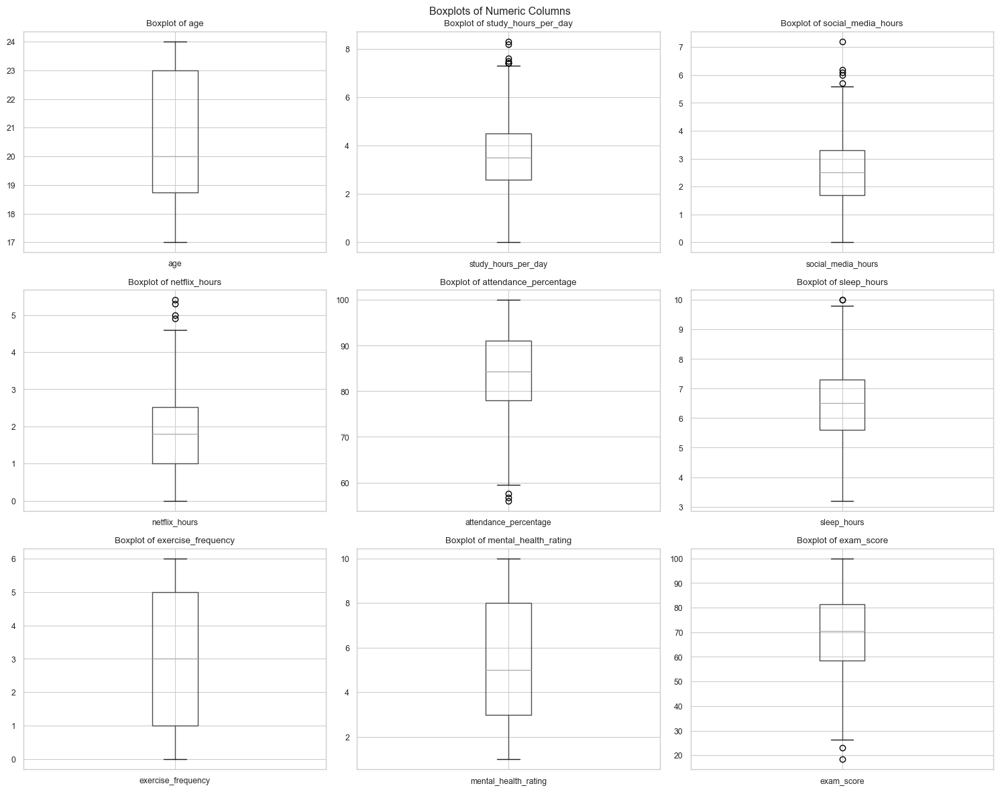

In [98]:
n_cols = 3
n_total = len(df_nums.columns)
n_rows = math.ceil(n_total/n_cols)
# create boxplots for each numeric column
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4*n_rows))
fig.suptitle('Boxplots of Numeric Columns')
axes = axes.flatten()

for i, col in enumerate(df_nums.columns):
    df_nums.boxplot(column=col, ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')

plt.tight_layout()
plt.show()

KDE plots provided further insight into the shape of each distribution, highlighting a few in which were skewed either left or right. Scatterplots were particularly useful for identifying relationships between predictors and the target variable, exam_score. Through these visualizations, we noticed that certain features, such as study_hours_per_day and mental_health_rating, showed strong positive correlations with exam scores. Conversely, features like netflix_hours and social_media_hours demonstrated negative correlations, suggesting that increased time spent on these activities may be associated with lower academic performance.

Correlation matrix:
exam_score               1.000000
study_hours_per_day      0.825419
mental_health_rating     0.321523
exercise_frequency       0.160107
sleep_hours              0.121683
attendance_percentage    0.089836
age                     -0.008907
social_media_hours      -0.166733
netflix_hours           -0.171779
Name: exam_score, dtype: float64


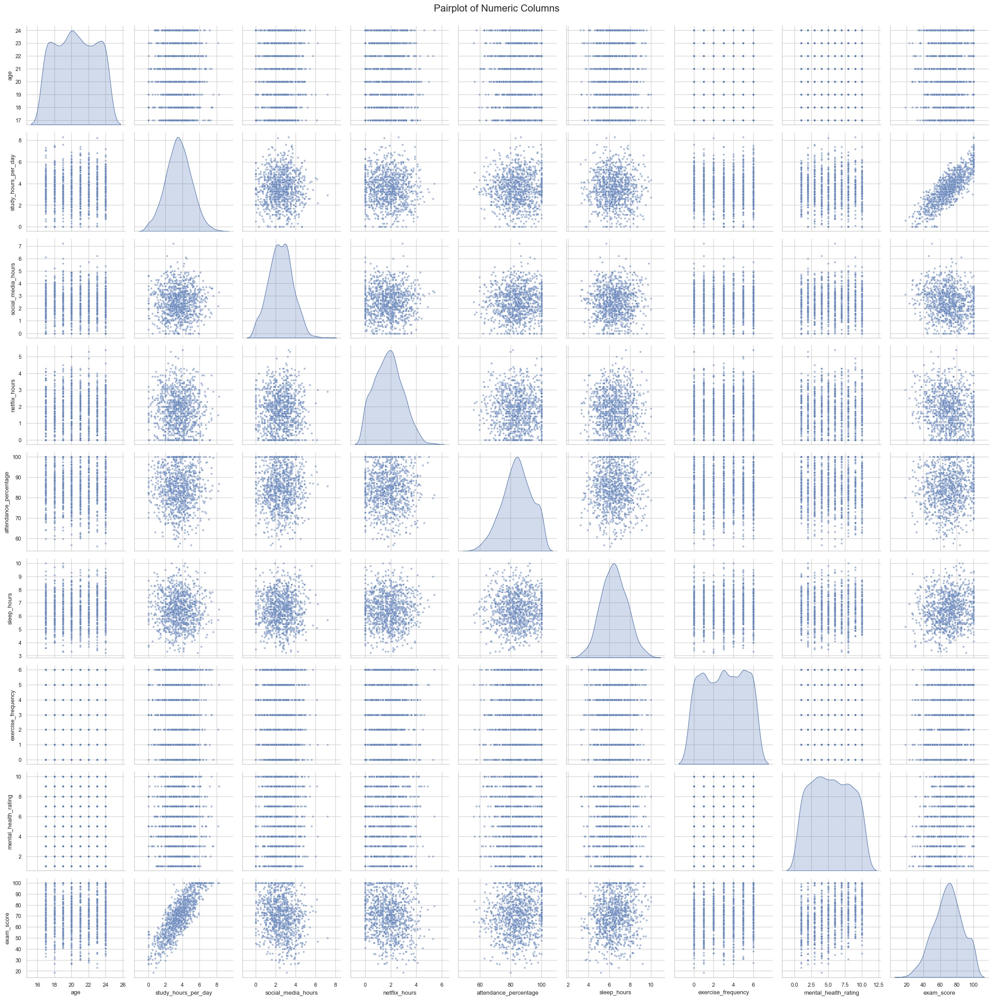

In [99]:
print(f'Correlation matrix:\n{df_nums.corr()['exam_score'].sort_values(ascending=False)}')

# create pairplot for numeric columns
sns.pairplot(df_nums, diag_kind='kde', plot_kws={'alpha':0.5, 's':10})
plt.suptitle('Pairplot of Numeric Columns', y=1, fontsize=16)
plt.tight_layout()
plt.show()

### Strongest Correlations for Numerical Features

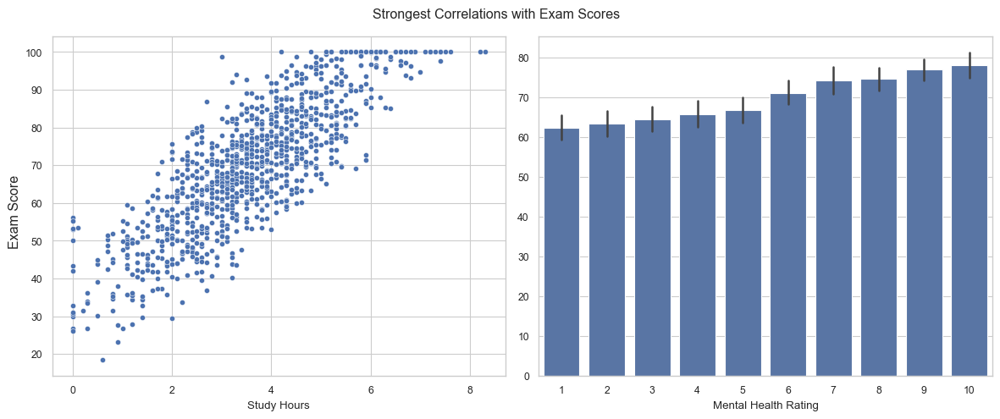

In [100]:
# study_hours_per_day shows a strong correlation with scores.
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Strongest Correlations with Exam Scores')
fig.supylabel('Exam Score')
axes = axes.flatten()

sns.scatterplot(x='study_hours_per_day', y='exam_score', data=df, ax=axes[0], s=20)
axes[0].set_xlabel('Study Hours')
axes[0].set_ylabel(None)

# Although numerical, mental_health_rating can be treated as categorical in this context.
sns.barplot(x='mental_health_rating', y='exam_score', data=df, ax=axes[1])
axes[1].set_xlabel('Mental Health Rating')
axes[1].set_ylabel(None)

plt.tight_layout()
plt.show()

# # If we were to break study hours into levels, how might the scoring be distributed?
# quantiles = df['study_hours_per_day'].quantile([0,0.33,0.66,1])
# df['study_level']=pd.cut(df['study_hours_per_day'], 	include_lowest=True, bins=quantiles, labels=['low', 'medium', 'high'])

# # check the distribution of exam scores by study level
# g=sns.FacetGrid(df, col='study_level', height=4, aspect=0.8)
# g.map(plt.hist, 'exam_score', color='blue')
# plt.show()





### Negative Correlations with Numerical Features

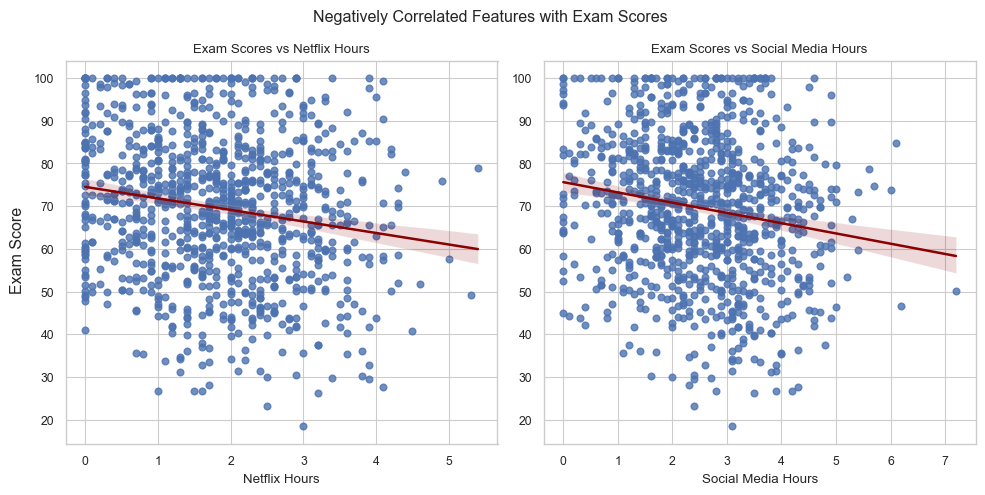

In [101]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes = axes.flatten()

fig.suptitle("Negatively Correlated Features with Exam Scores")
fig.subplots_sharey = True
fig.supylabel('Exam Score')

# slight negative correlation between netflix_hours and exam_scores.
sns.regplot(x='netflix_hours', y='exam_score', data=df, ax=axes[0], line_kws={'color':'darkred'})
axes[0].set_title('Exam Scores vs Netflix Hours')
axes[0].set_xlabel('Netflix Hours')
axes[0].set_ylabel(None)


# slight negative correlation betweeen social_media_hours and exam_scores.

sns.regplot(x='social_media_hours', y='exam_score', data=df, ax=axes[1], line_kws={'color':'darkred'})
axes[1].set_title('Exam Scores vs Social Media Hours')
axes[1].set_xlabel('Social Media Hours')
axes[1].set_ylabel(None)

plt.tight_layout()
plt.show()

## Understanding the Categorical Data

Below, we create scatter plots of our numerical data versus exam_score, with categorical data used as a hue. While we can see that study_hours_per_day has the strongest positive correlation to exam_scores, the categorical data does not influence our exam_scores. With this in mind, we will continue our study focusing on the numerical data.

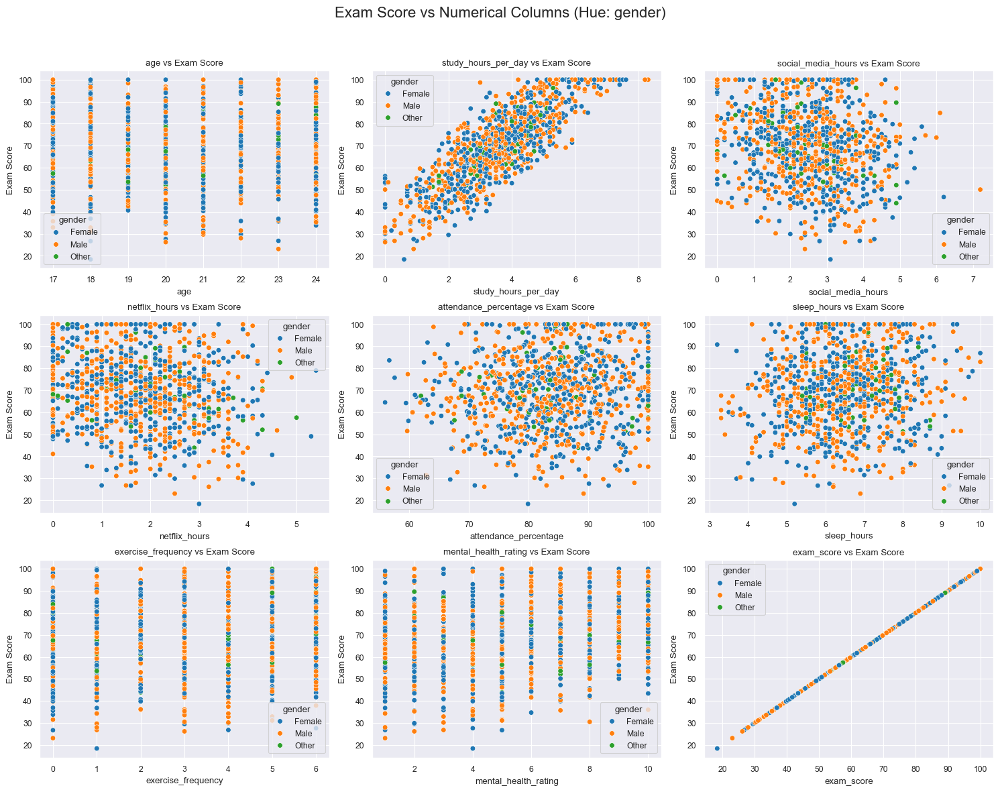

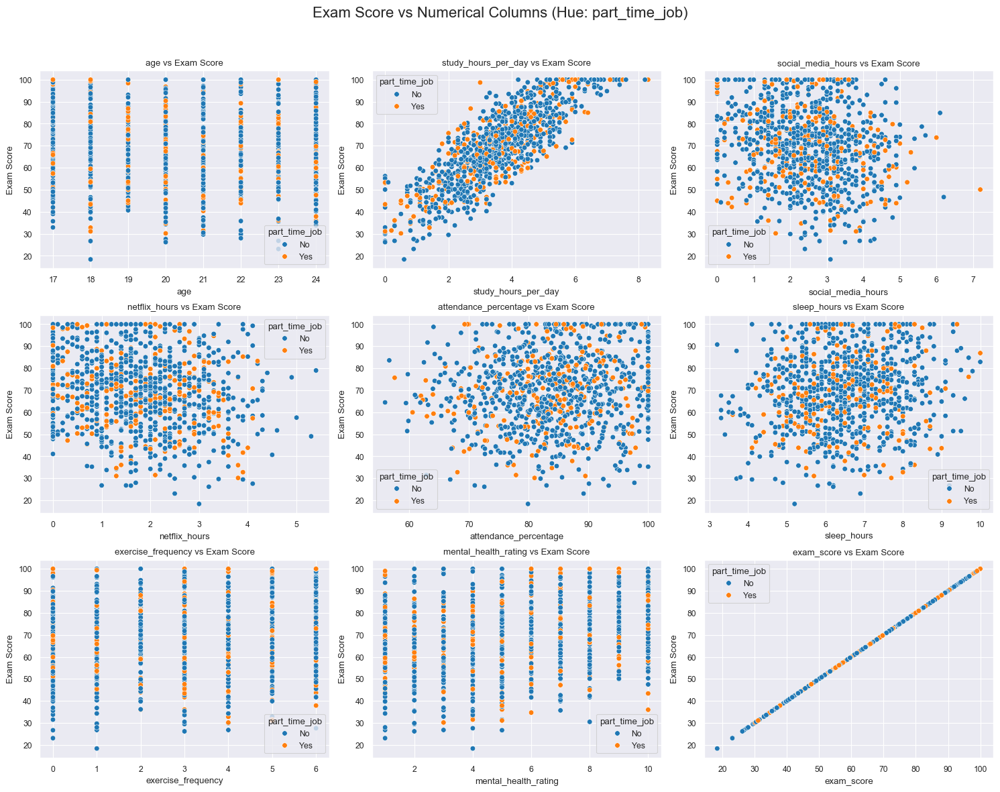

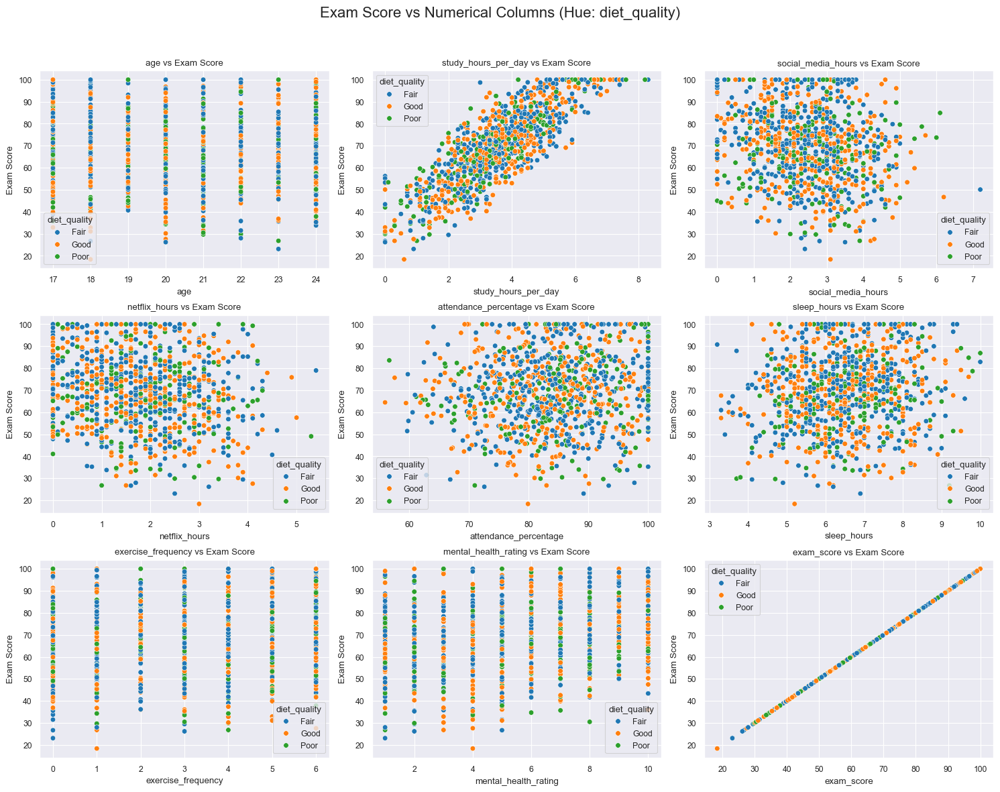

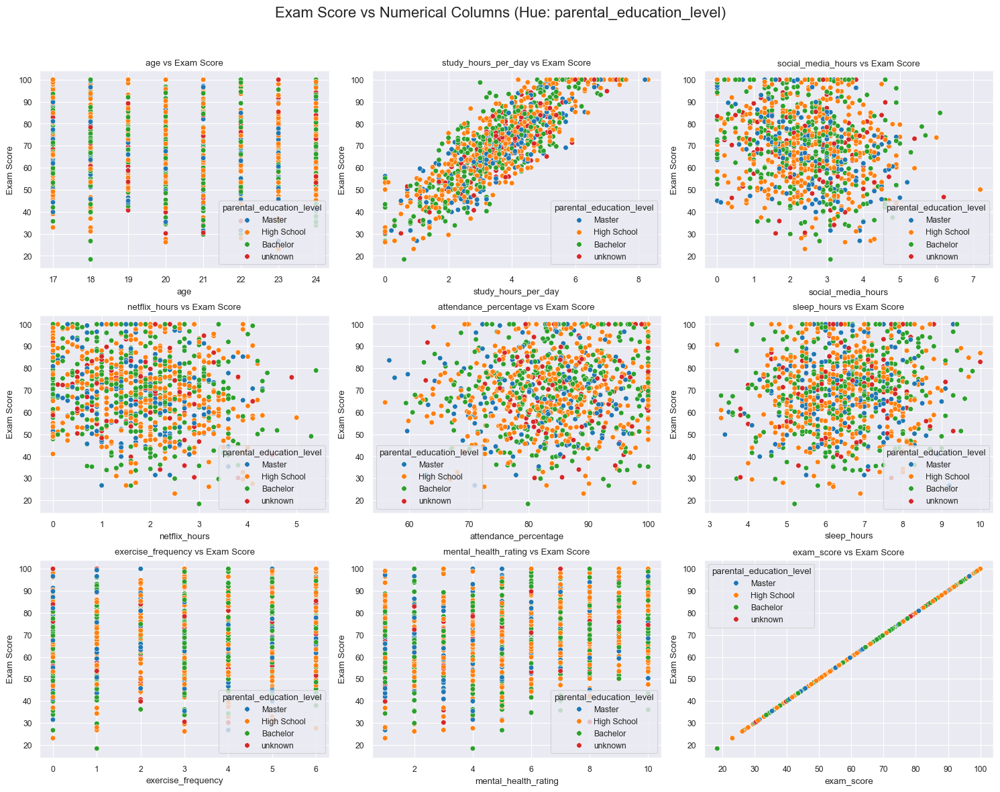

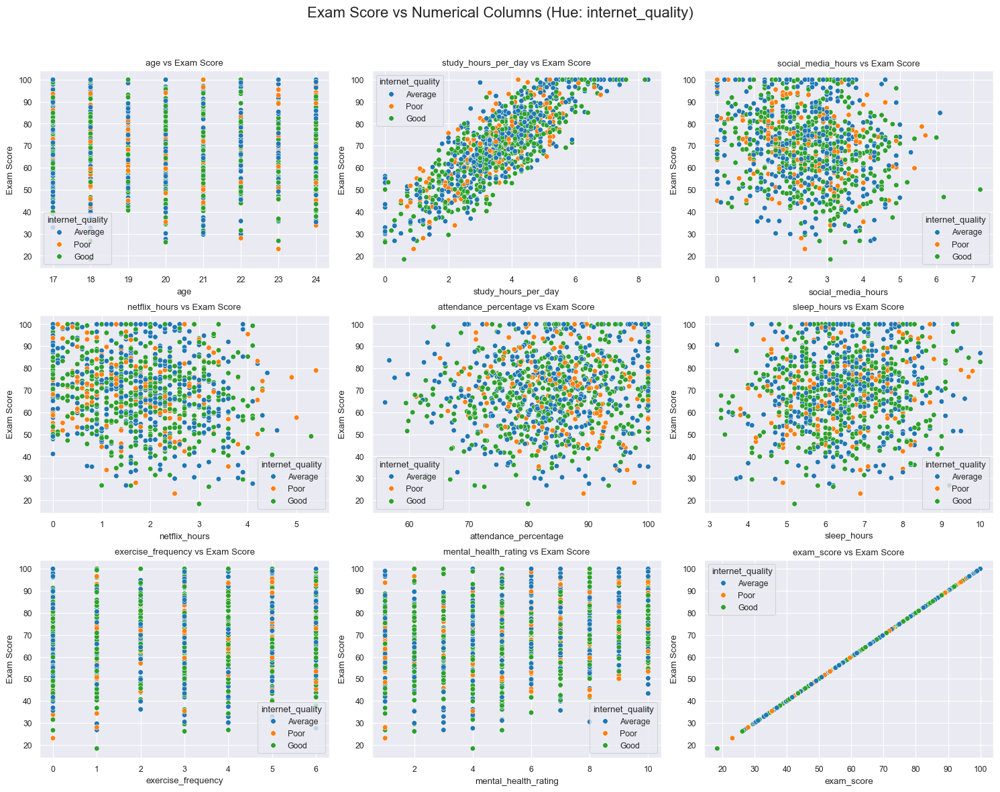

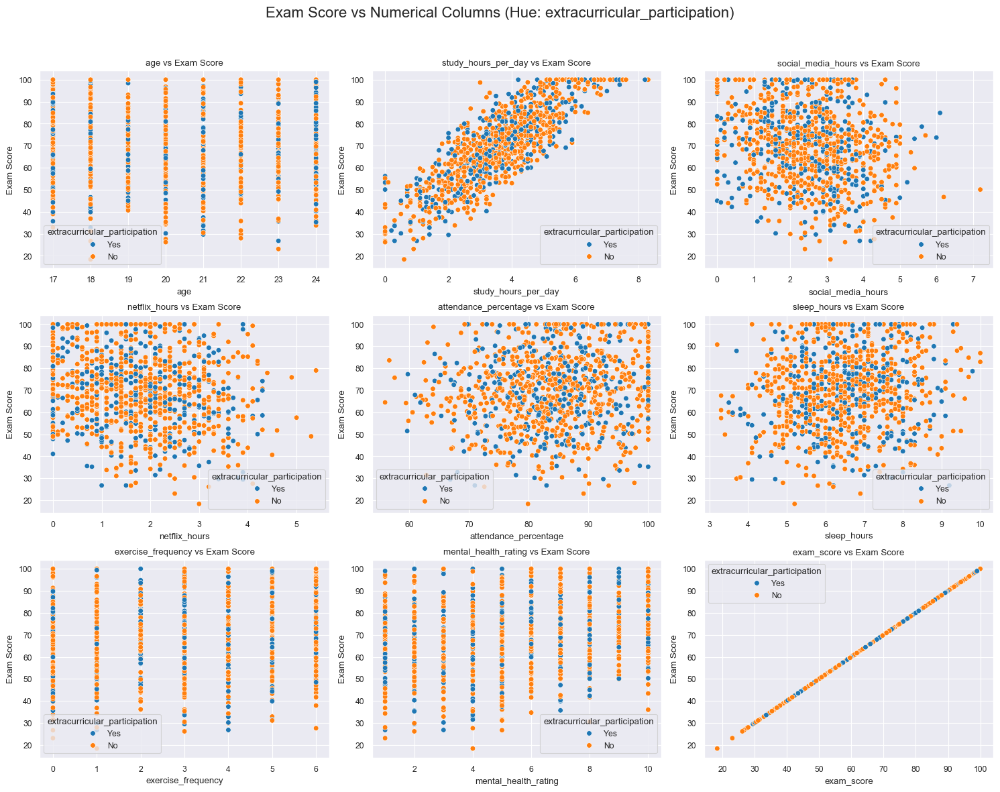

In [61]:
# plot exam scores vs each numerical column with hue for each categorical column
ncols = 3
nrows = 3
plots_per_fig = ncols * nrows

# Loop through each categorical column as hue
for cat_col in df_cats.columns:
    total = len(df_nums.columns)
    num_figs = math.ceil(total / plots_per_fig)

    for fig_idx in range(num_figs):
        fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 4))
        axes = axes.flatten()  # Flatten 2D array to 1D for easy indexing
        fig.suptitle(f'Exam Score vs Numerical Columns (Hue: {cat_col})', fontsize=16)

        for i in range(plots_per_fig):
            data_idx = fig_idx * plots_per_fig + i
            if data_idx >= total:
                axes[i].axis('off')  # Turn off unused subplot
                continue

            num_col = df_nums.columns[data_idx]
            sns.scatterplot(
                data=df,
                x=num_col,
                y='exam_score',
                hue=cat_col,
                ax=axes[i],
                s=30,
                palette='tab10'
            )
            axes[i].set_title(f'{num_col} vs Exam Score')
            axes[i].set_xlabel(num_col)
            axes[i].set_ylabel('Exam Score')

        plt.tight_layout()
        plt.subplots_adjust(top=0.9)  # Make room for suptitle
        plt.show()


## Correlation Analysis

Below is a correlation analysis of our numerical categories. From this analysis, we can confirm that our predictors for exam_scores should be the following: 
-study_hours_per_day 
-mental_health_rating
-exericse_frequency
-social_media_hours
-netflix_hours

A variety of both positive and negative correlations is necessary so that our model does not focus solely on positive correlations.

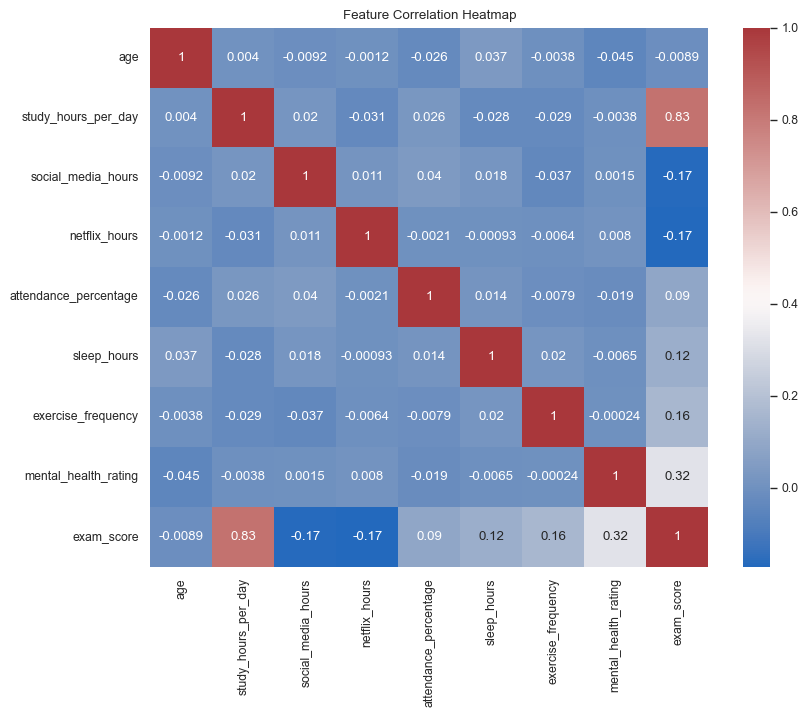

In [62]:
num_cols = df_nums.columns
cat_cols = df_cats.columns
corr = df[num_cols].corr()
corr['exam_score'].sort_values(ascending=False)
plt.figure()
sns.heatmap(corr, cmap="vlag", annot=True)
plt.title("Feature Correlation Heatmap")
plt.show()

## Distributions on Positive Correlation 

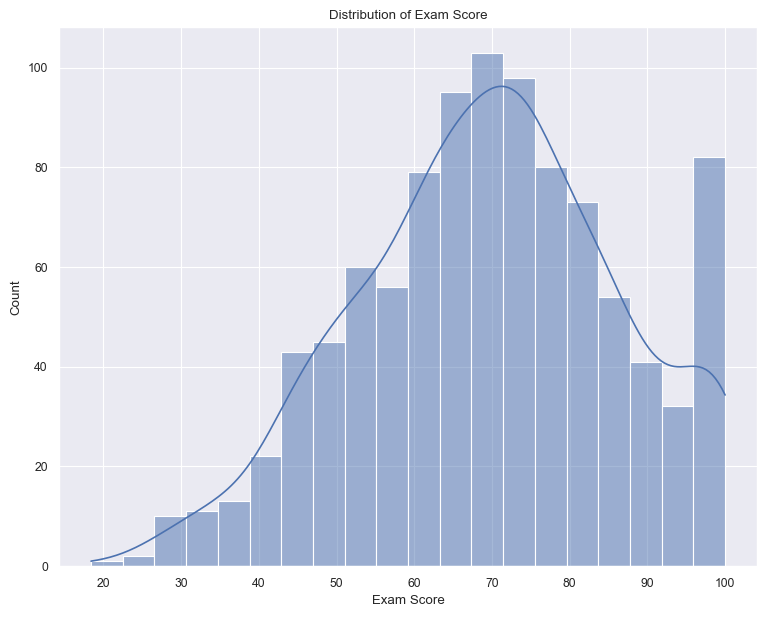

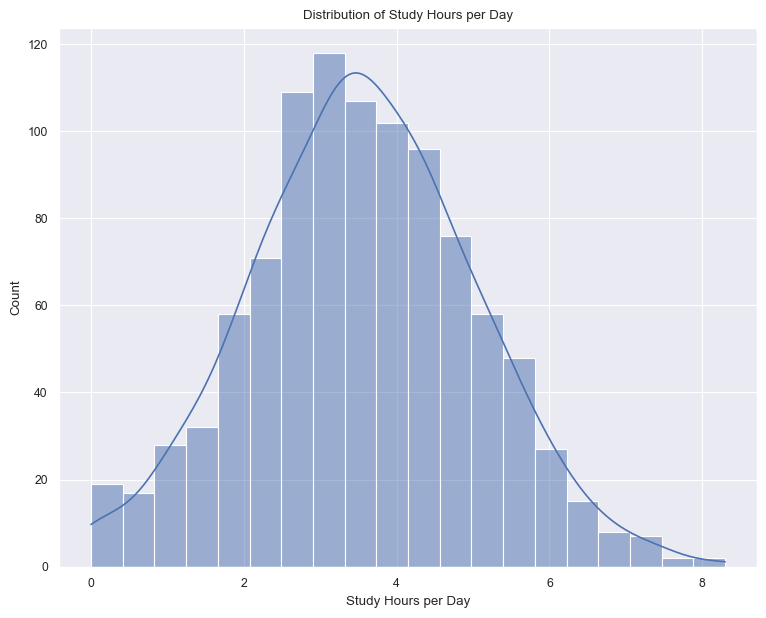

In [63]:
#Historgram: exam_score
plt.figure()
sns.histplot(df['exam_score'], bins=20, kde=True)
plt.title("Distribution of Exam Score")
plt.xlabel("Exam Score")
plt.show()

#Histogram: study_hours_per_day
plt.figure()
sns.histplot(df['study_hours_per_day'], bins=20, kde=True)
plt.title("Distribution of Study Hours per Day")
plt.xlabel("Study Hours per Day")
plt.show()

## Regression Plots on Positive correlations 

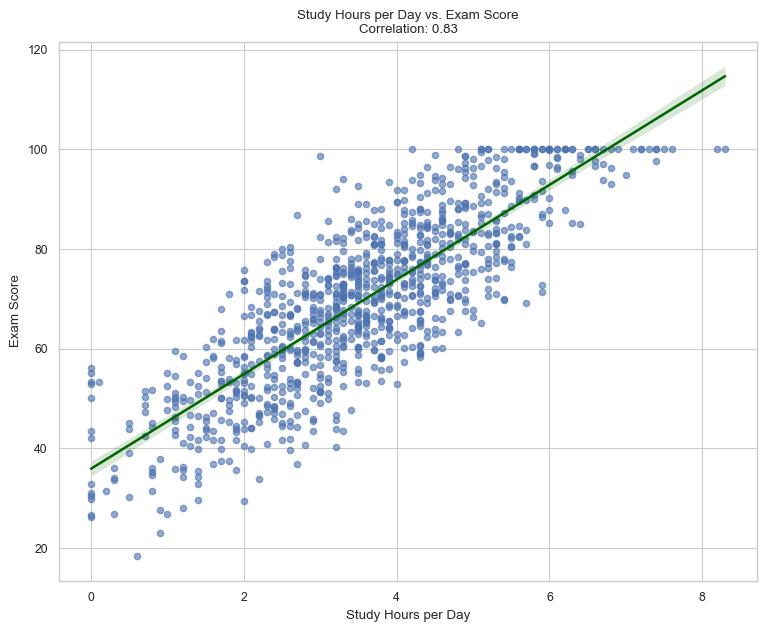

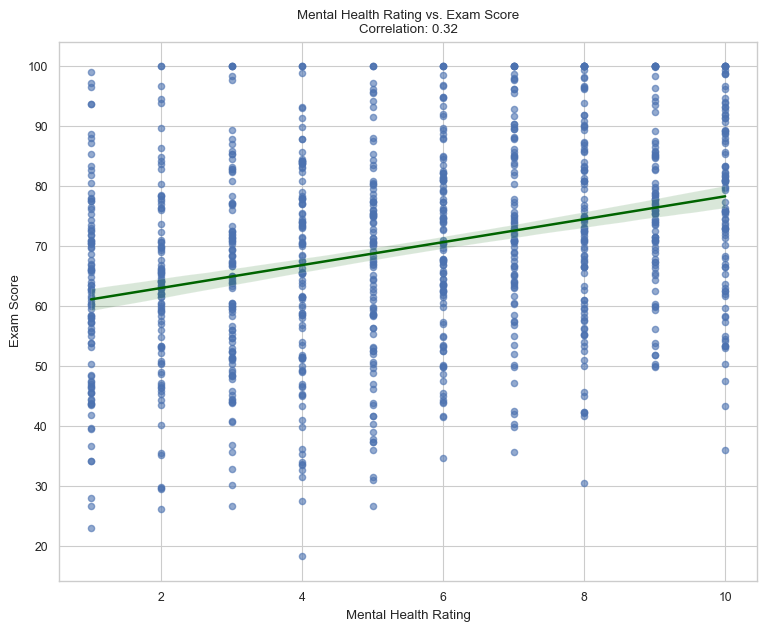

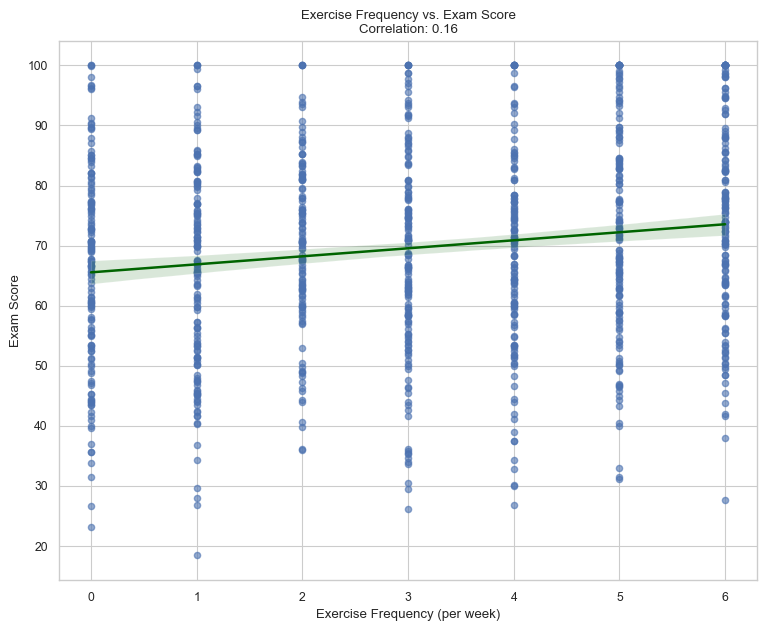

In [64]:
#Regression plot: Study Hours vs. Exam Score
sns.set_style("whitegrid")
plt.figure()
sns.regplot(x='study_hours_per_day', y='exam_score', data=df,scatter_kws={'s':20, 'alpha':0.6}, line_kws={'color':'darkgreen'})
plt.title("Study Hours per Day vs. Exam Score\nCorrelation: {:.2f}".format(corr.loc['study_hours_per_day','exam_score']))
plt.xlabel("Study Hours per Day")
plt.ylabel("Exam Score")
plt.show()

#Regression plot: Mental Health Rating vs. Exam Score
sns.set_style("whitegrid")
plt.figure()
sns.regplot(x='mental_health_rating', y='exam_score', data=df, scatter_kws={'s':20, 'alpha':0.6}, line_kws={'color':'darkgreen'})
plt.title("Mental Health Rating vs. Exam Score\nCorrelation: {:.2f}".format(corr.loc['mental_health_rating','exam_score']))
plt.xlabel("Mental Health Rating")
plt.ylabel("Exam Score")
plt.show()

#Regression plot: Exercise Frequency vs. Exam Score
plt.figure()
sns.regplot(x='exercise_frequency', y='exam_score', data=df, scatter_kws={'s':20, 'alpha':0.6}, line_kws={'color':'darkgreen'})
plt.title("Exercise Frequency vs. Exam Score\nCorrelation: {:.2f}".format(corr.loc['exercise_frequency','exam_score']))
plt.xlabel("Exercise Frequency (per week)")
plt.ylabel("Exam Score")
plt.show()

## Regression Plots on Negative Correlations 

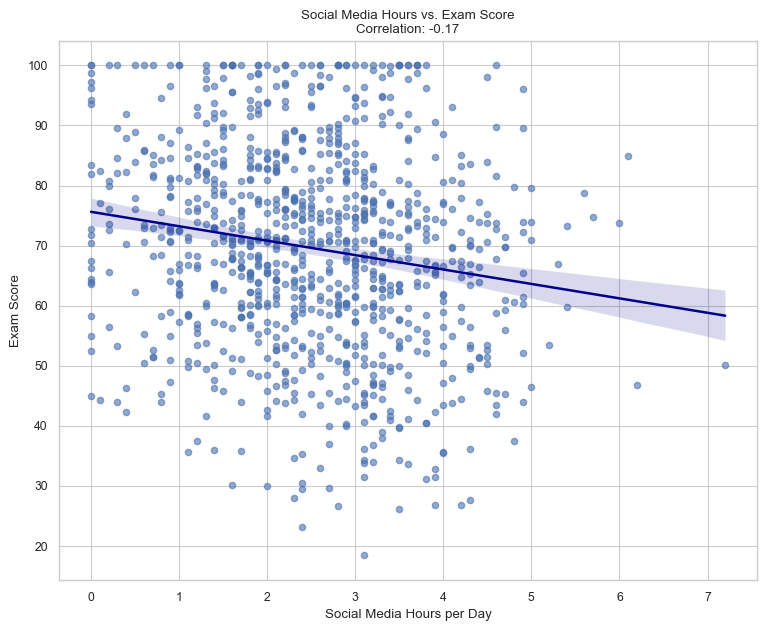

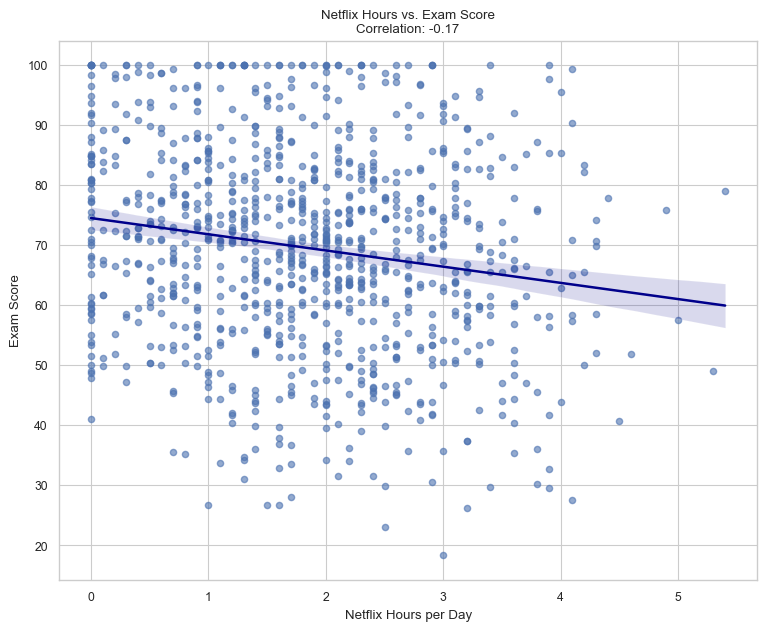

In [65]:
# Regression plot: social_media_hours vs exam_score
plt.figure()
sns.regplot(x='social_media_hours', y='exam_score', data=df, scatter_kws={'s':20, 'alpha':0.6},line_kws={'color':'darkblue'})
plt.title("Social Media Hours vs. Exam Score\nCorrelation: {:.2f}".format(corr.loc['social_media_hours','exam_score']))
plt.xlabel("Social Media Hours per Day")
plt.ylabel("Exam Score")
plt.show()

# Regression plot: netflix_hours vs exam_score
plt.figure()
sns.regplot(x='netflix_hours', y='exam_score', data=df,scatter_kws={'s':20, 'alpha':0.6}, line_kws={'color':'darkblue'})
plt.title("Netflix Hours vs. Exam Score\nCorrelation: {:.2f}".format(corr.loc['netflix_hours','exam_score']))
plt.xlabel("Netflix Hours per Day")
plt.ylabel("Exam Score")
plt.show()


## Group Comparisons

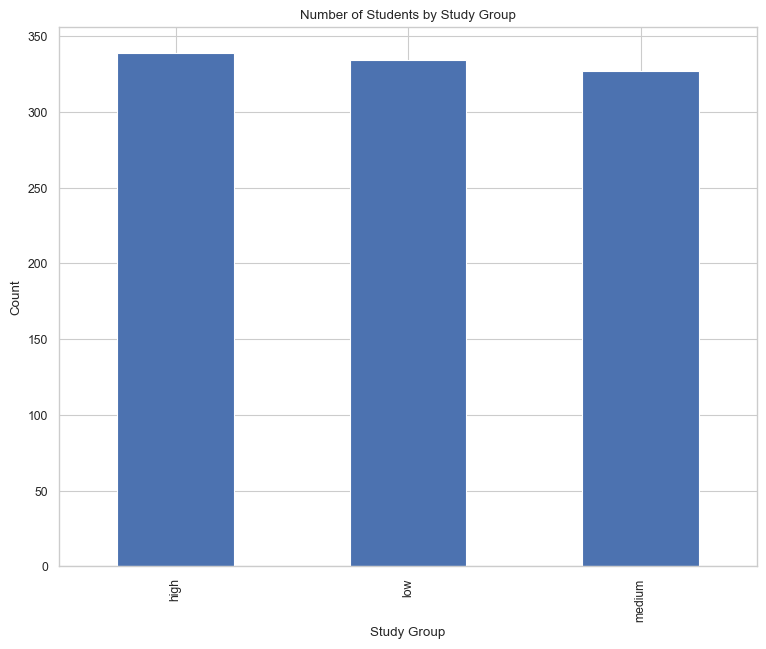

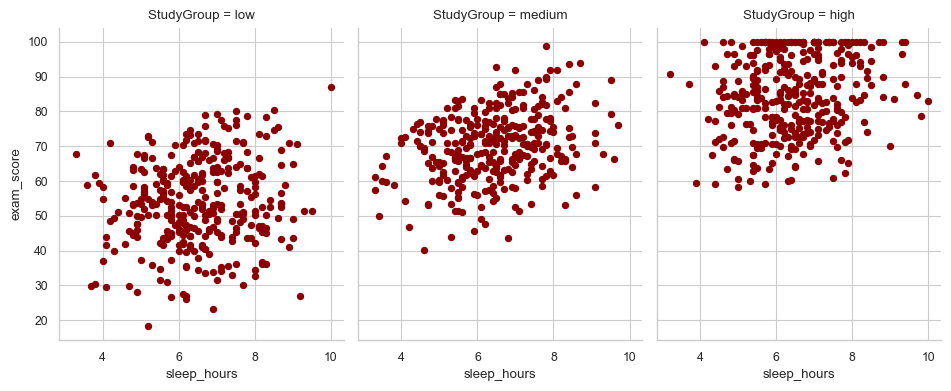

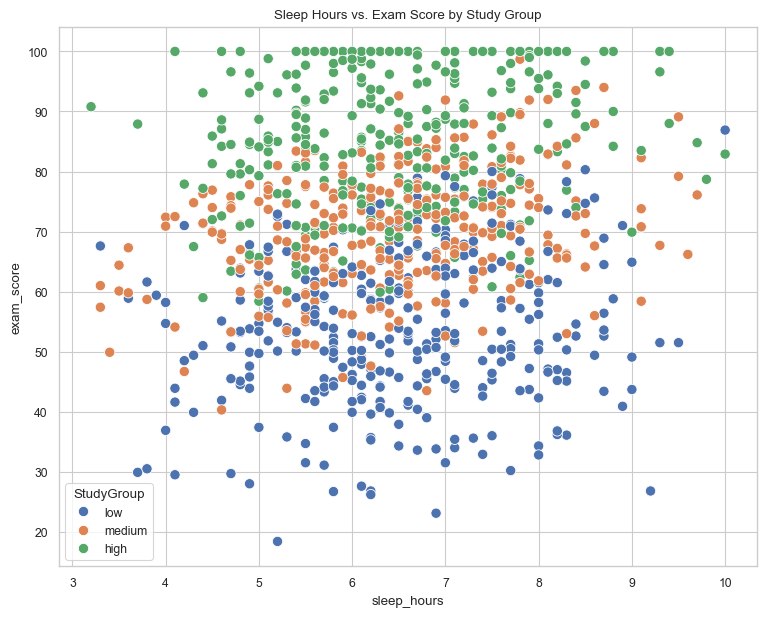

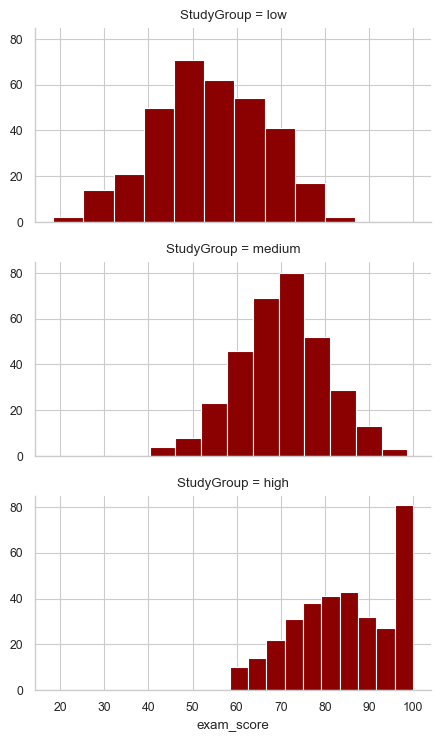

In [66]:
breaks = df['study_hours_per_day'].quantile([0, 0.33, 0.66, 1.0])
df['StudyGroup'] = pd.cut(df['study_hours_per_day'], include_lowest=True, bins=breaks, labels=['low', 'medium', 'high'])

#Bar chart of counts by StudyGroup
sns.set_style("whitegrid")
df['StudyGroup'].value_counts().plot.bar()
plt.title("Number of Students by Study Group")
plt.xlabel("Study Group")
plt.ylabel("Count")
plt.show()

#Faceted scatter: sleep_hours vs. exam_score by StudyGroup
sns.set_style("whitegrid")
g = sns.FacetGrid(df, col='StudyGroup', col_order=['low', 'medium', 'high'], height=4, aspect=0.8)
g.map(plt.scatter, 'sleep_hours', 'exam_score', s=20, color='darkred')
plt.show()

#Scatterplot with hue by StudyGroup
sns.set_style("whitegrid")
sns.scatterplot(x='sleep_hours',y='exam_score',data=df, hue='StudyGroup', s=55)
plt.title("Sleep Hours vs. Exam Score by Study Group")
plt.show()


#Histograms of exam_score by StudyGroup
sns.set_style("whitegrid")
g = sns.FacetGrid(df, row='StudyGroup', height=2.5, aspect=1.8)
g.map(plt.hist, 'exam_score', color="darkred")
plt.show()

## kNN Regression 

In [67]:
features = ['study_hours_per_day', 'mental_health_rating', 'exercise_frequency' ]

X = df[features].values
y = df['exam_score'].values

#split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

#scale
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)


for k in [3,5,7]:
    regr = KNeighborsRegressor(n_neighbors=k)
    regr.fit(X_train, y_train)
    preds = regr.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    print(f"k={k} RMSE: {rmse:.2f}")

#Blind MSE using y_train
blind_pred = y_train.mean()
mse_blind = mean_squared_error(y_test, [blind_pred]*len(y_test))
print(f'Blind MSE:  {mse_blind:.0f}')
rmse_blind = np.sqrt(mse_blind)
print("Blind RMSE: {:.2f}".format(rmse_blind))

regr = KNeighborsRegressor(n_neighbors=7)
regr.fit(X_train, y_train)

#predictions 
predictions = regr.predict(X_test)

k=3 RMSE: 8.29
k=5 RMSE: 7.68
k=7 RMSE: 7.37
Blind MSE:  279
Blind RMSE: 16.69


## Anomaly Detection (Positive Features)

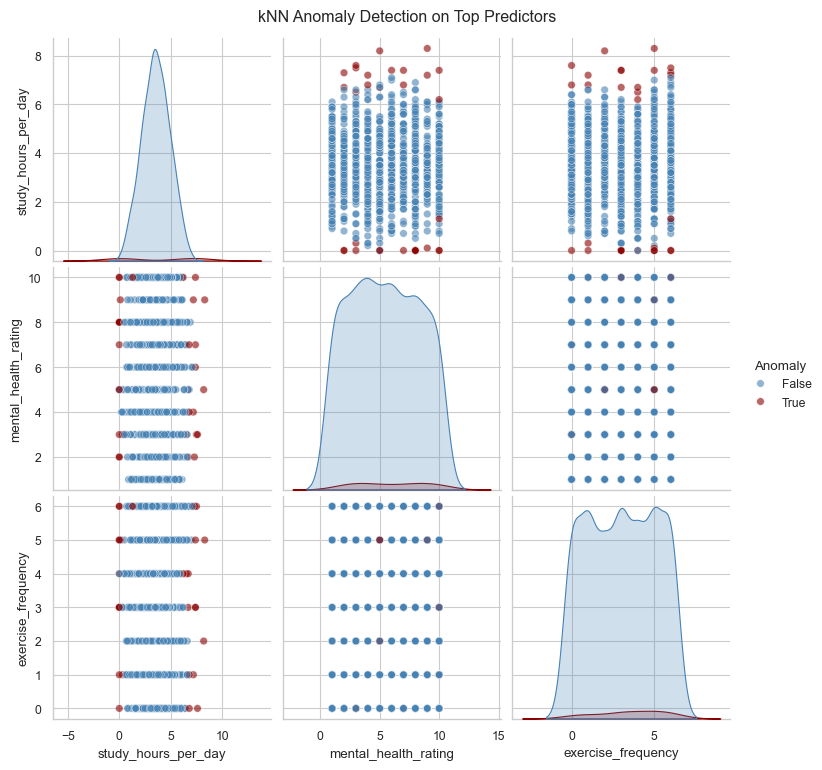

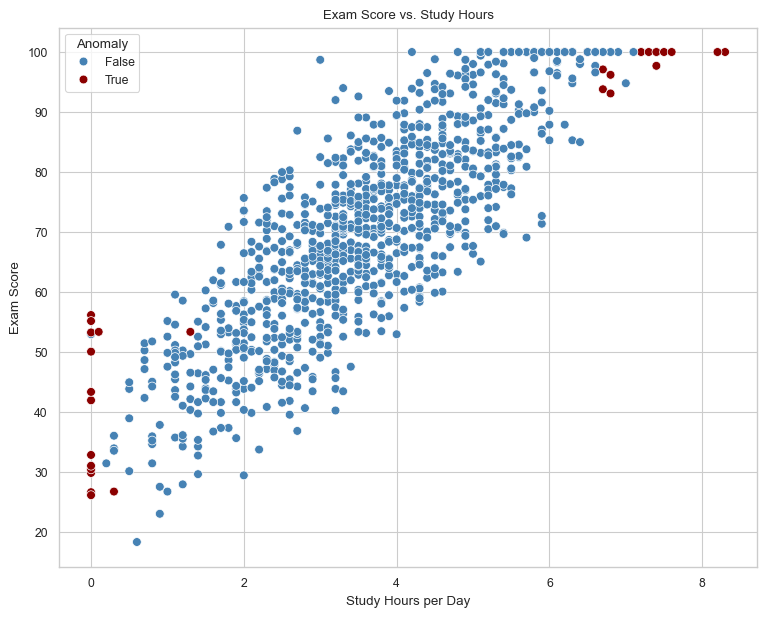

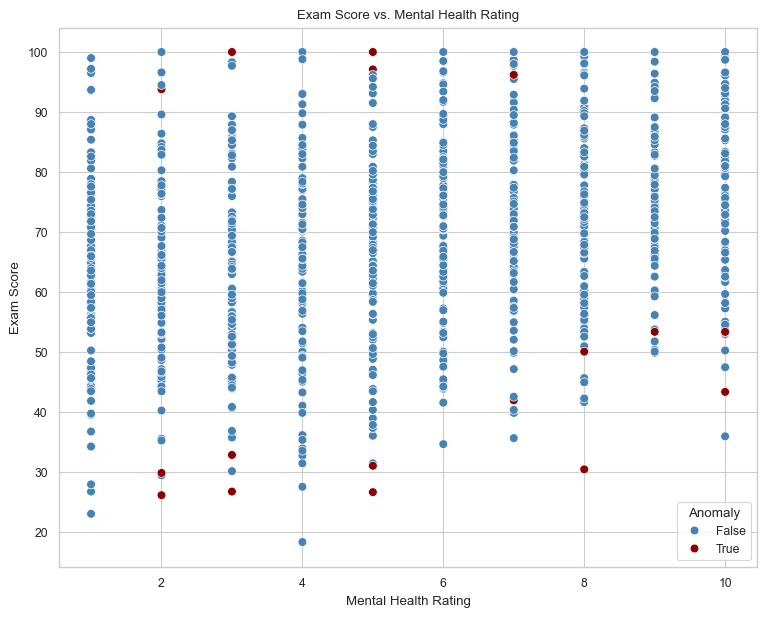

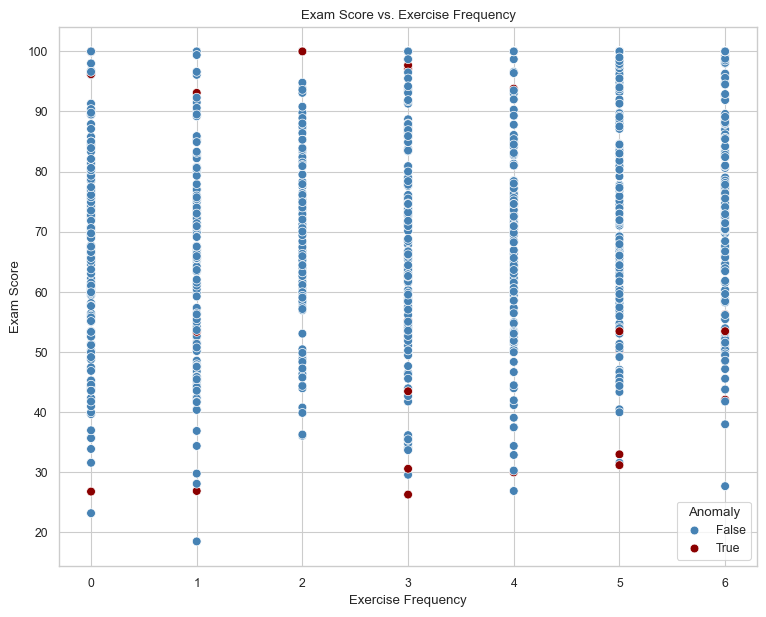

In [68]:
def edist(x, y):
    return np.sqrt(np.sum((x-y)**2))

def dist(x):
    m = x.shape[0]
    dm = np.zeros((m, m))
    for i in range(m):
        for j in range(i, m):
            dm[i, j] = edist(x[i], x[j])
            dm[j, i] = dm[i, j]
    return dm

def knn_anomalies(df, k=7, threshold=2.5):
    # scale the data and compute distance matrix
    x = df.apply(zscore).values
    dm = dist(x)
    
    m = x.shape[0]
    k_distances = np.zeros(m)
    
    for i in range(m):
        row = dm[i, :]
        row_sorted = np.sort(row)
        k_distances[i] = row_sorted[k]
    
    kd_zscores = zscore(k_distances)
    
    anomaly_idxs = np.where(kd_zscores > threshold)[0]
    return anomaly_idxs

anoms = knn_anomalies(df[features], k=7, threshold=2.5)

#Add a new 'Anomaly' column to the main df
x = np.full(len(df), False)
x[anoms] = True
df['Anomaly'] = x

df_anom = df[features].copy()
df_anom['Anomaly'] = df['Anomaly']

#Plot all anomalies
sns.pairplot(df_anom, vars=features, hue='Anomaly', diag_kind='kde', palette={False: 'steelblue', True: 'darkred'}, plot_kws={'s':30, 'alpha':0.6})
plt.suptitle("kNN Anomaly Detection on Top Predictors", y=1.02)
plt.show()

#Scatter: Study Hours vs. Exam Score
plt.figure()
sns.scatterplot(x='study_hours_per_day',y='exam_score',data=df,hue='Anomaly',palette={False: 'steelblue', True: 'darkred'},s=40)
plt.title("Exam Score vs. Study Hours")
plt.xlabel("Study Hours per Day")
plt.ylabel("Exam Score")
plt.legend(title='Anomaly', loc='best')
plt.show()

# Mental Health vs. Exam Score
plt.figure()
sns.scatterplot(x='mental_health_rating',y='exam_score',data=df,hue='Anomaly',palette={False: 'steelblue', True: 'darkred'},s=40)
plt.title("Exam Score vs. Mental Health Rating")
plt.xlabel("Mental Health Rating")
plt.ylabel("Exam Score")
plt.legend(title='Anomaly', loc='best')
plt.show()

# Exercise Frequency vs. Exam Score
plt.figure()
sns.scatterplot(x='exercise_frequency',y='exam_score',data=df,hue='Anomaly',palette={False: 'steelblue', True: 'darkred'},s=40)
plt.title("Exam Score vs. Exercise Frequency")
plt.xlabel("Exercise Frequency")
plt.ylabel("Exam Score")
plt.legend(title='Anomaly', loc='best')
plt.show()

## Anomaly Detection (Negative Features)

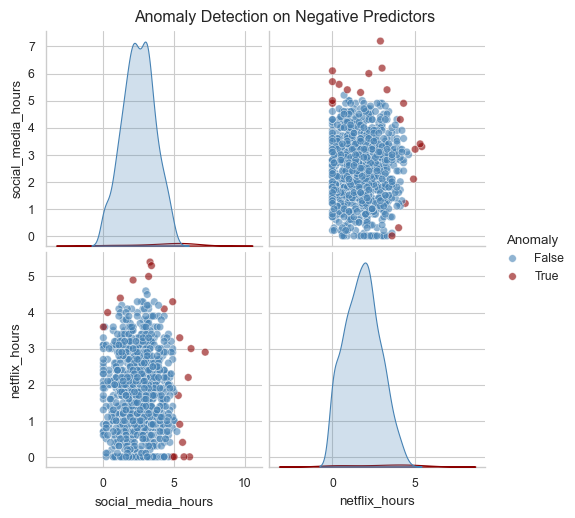

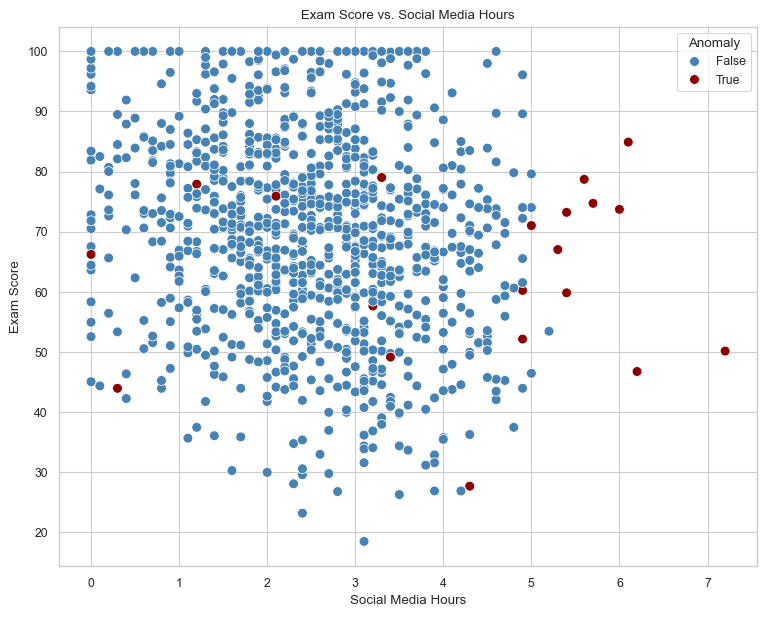

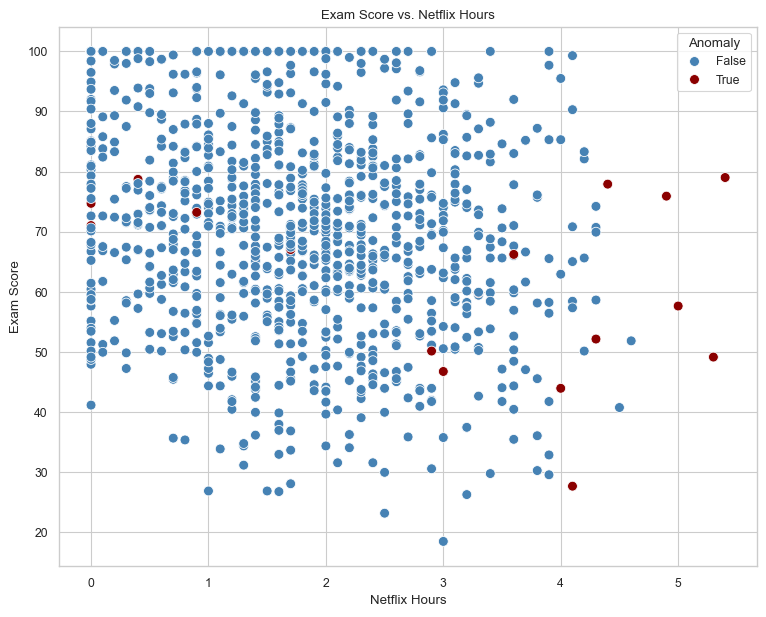

In [69]:
features_neg = ['social_media_hours', 'netflix_hours']
df_anom_neg = df[features_neg].copy()
df_scaled_neg = df_anom_neg.apply(zscore)

anoms_neg = knn_anomalies(df_scaled_neg, k=7, threshold=2.5)

# Mark anomalies in the main df
flags = np.full(len(df), False)
flags[anoms_neg] = True
df['Anomaly'] = flags

#Pairplot: two negative features
sns.pairplot(df_anom_neg.assign(Anomaly=flags), vars=features_neg,hue='Anomaly',diag_kind='kde', palette={False: 'steelblue', True: 'darkred'}, plot_kws={'s':30, 'alpha':0.6})
plt.suptitle("Anomaly Detection on Negative Predictors", y=1.02)
plt.show()

#Scatter: Social Media Hours vs. Exam Score
plt.figure()
sns.scatterplot(x='social_media_hours', y='exam_score',data=df,hue='Anomaly', palette={False: 'steelblue', True: 'darkred'},s=50)
plt.title("Exam Score vs. Social Media Hours")
plt.xlabel("Social Media Hours")
plt.ylabel("Exam Score")
plt.show()

#Scatter: Netflix Hours vs. Exam Score
plt.figure()
sns.scatterplot(x='netflix_hours',y='exam_score',data=df,hue='Anomaly',palette={False: 'steelblue', True: 'darkred'},s=50)
plt.title("Exam Score vs. Netflix Hours")
plt.xlabel("Netflix Hours")
plt.ylabel("Exam Score")
plt.show()

## Prediction vs. True Plot

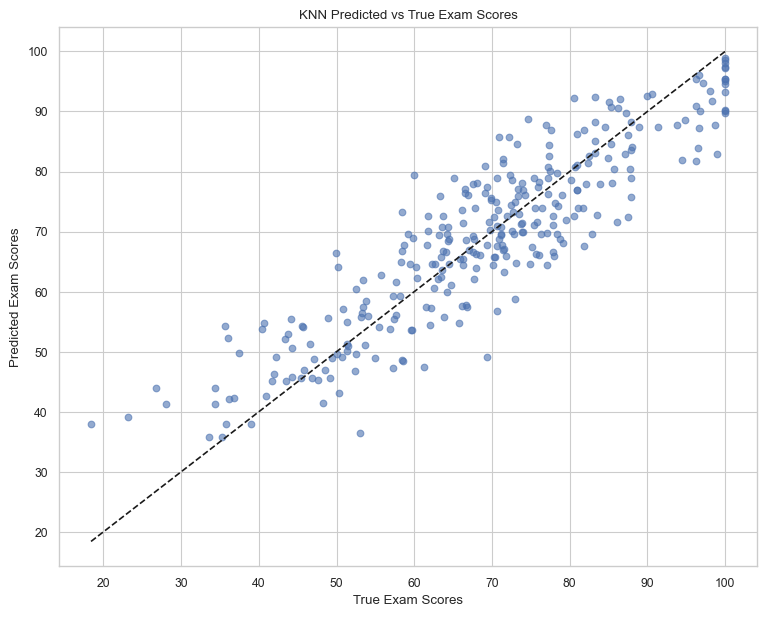

In [70]:
plt.figure()
plt.scatter(y_test, predictions, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--')
plt.xlabel("True Exam Scores")
plt.ylabel("Predicted Exam Scores")
plt.title("KNN Predicted vs True Exam Scores")
plt.show()


## Linear Regression


In [75]:
import itertools
from sklearn.linear_model import LinearRegression
from sklearn.metrics import root_mean_squared_error, r2_score
from sklearn.model_selection import KFold, cross_validate

predictors = df.select_dtypes(include=[np.number]).columns  # example predictors
predictors = predictors[predictors != 'exam_score']  # Exclude target variable
target = 'exam_score'

results = []

for k in range(1, len(predictors)+1):
    for combo in itertools.combinations(predictors, k):
        #
        X = df[list(combo)].values
        y = df[target].values
        sub_results = []
        
        # Split the data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        # Apply cross validation
        cv = KFold(n_splits=10, shuffle=True, random_state=42)
        model = LinearRegression()
        cv_results = cross_validate(model, X_train, y_train, cv=cv, scoring=['neg_root_mean_squared_error', 'r2'])

        results.append({
            'predictors': combo,
            'rmse-mean': -np.mean(cv_results['test_neg_root_mean_squared_error']),
            'r2-mean': np.mean(cv_results['test_r2'])
        })
        
results_sorted = sorted(results, key=lambda x: x['r2-mean'], reverse=True)
# Display the top 10 results
print("Top 10 Predictor Combinations:")
print("Predictors | r2 avg | RMSE avg")
print("-" * 50)
for res in results_sorted[:10]:  # Show top 10
    print(f"Predictors: {res['predictors']}, r2 avg: {res['r2-mean']:.3f}, RMSE avg: {res['rmse-mean']:.2f}")

Top 10 Predictor Combinations:
Predictors | r2 avg | RMSE avg
--------------------------------------------------
Predictors: ('study_hours_per_day', 'social_media_hours', 'netflix_hours', 'attendance_percentage', 'sleep_hours', 'exercise_frequency', 'mental_health_rating'), r2 avg: 0.894, RMSE avg: 5.40
Predictors: ('age', 'study_hours_per_day', 'social_media_hours', 'netflix_hours', 'attendance_percentage', 'sleep_hours', 'exercise_frequency', 'mental_health_rating'), r2 avg: 0.893, RMSE avg: 5.41
Predictors: ('study_hours_per_day', 'social_media_hours', 'netflix_hours', 'sleep_hours', 'exercise_frequency', 'mental_health_rating'), r2 avg: 0.887, RMSE avg: 5.56
Predictors: ('age', 'study_hours_per_day', 'social_media_hours', 'netflix_hours', 'sleep_hours', 'exercise_frequency', 'mental_health_rating'), r2 avg: 0.887, RMSE avg: 5.57
Predictors: ('study_hours_per_day', 'social_media_hours', 'netflix_hours', 'attendance_percentage', 'exercise_frequency', 'mental_health_rating'), r2 avg: 

Best combination of predictors: ('study_hours_per_day', 'social_media_hours', 'netflix_hours', 'attendance_percentage', 'sleep_hours', 'exercise_frequency', 'mental_health_rating')
Best Model RMSE: 5.30, R^2: 0.899


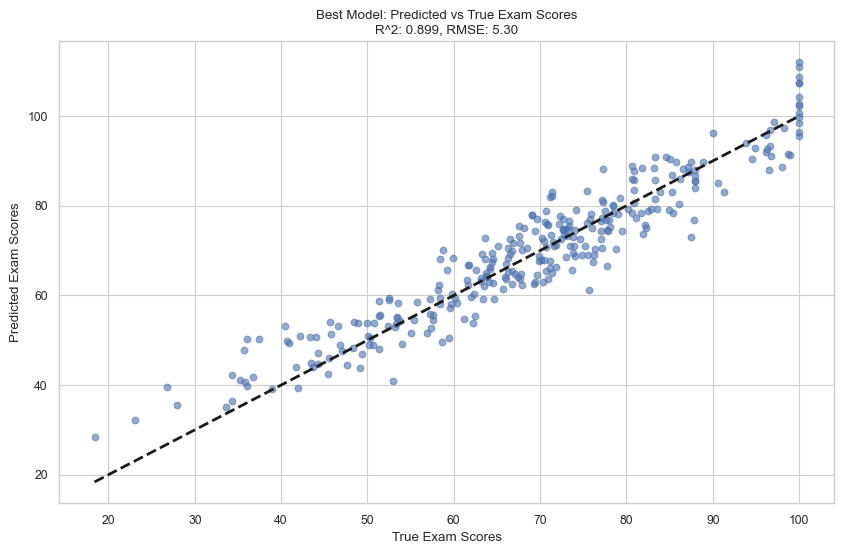

In [ ]:
top_combo = results_sorted[0]['predictors']
print(f"Best combination of predictors: {top_combo}")

# Train a linear regression model with the best predictors
X_best = df[list(top_combo)]
y_best = df[target]
X_train, X_test, y_train, y_test = train_test_split(X_best, y_best, test_size=0.3, random_state=42)
# Scale the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
# Train the model
reg = LinearRegression()
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)

# Evaluate the model
rmse_best = root_mean_squared_error(y_test, y_pred)
r2_best = r2_score(y_test, y_pred)
print(f"Best Model RMSE: {rmse_best:.2f}, R^2: {r2_best:.3f}")

# Plotting the best model predictions
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel("True Exam Scores")
plt.ylabel("Predicted Exam Scores")
plt.title(f"Best Model: Predicted vs True Exam Scores\nR^2: {r2_best:.3f}, RMSE: {rmse_best:.2f}")
plt.show()